In [1]:
import pandas as pd
# license is always null so we can drop it
df = pd.read_csv(filepath_or_buffer='/kaggle/input/airbnb-listings/listings.csv', index_col=['id'], 
                 parse_dates=['last_review']).drop(columns=['neighbourhood_group', 'license'])
df.head()

,name,host_id,host_name,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365,number_of_reviews_ltm
id,,,,,,,,,,,,,,,
5456,Guesthouse in Austin · ★4.84 · 1 bedroom · 2 b...,8028,Sylvia,78702,30.26057,-97.73441,Entire home/apt,126,2,657,2023-08-27,3.72,1,306,42
5769,Home in Austin · ★4.90 · 1 bedroom · 1 bed · 1...,8186,Elizabeth,78729,30.45697,-97.78422,Private room,45,1,290,2023-08-04,1.77,1,0,21
6413,Guesthouse in Austin · ★4.97 · Studio · 1 bed ...,13879,Todd,78704,30.24885,-97.73587,Entire home/apt,57,30,122,2022-10-17,0.73,1,0,3
6448,Guesthouse in Austin · ★4.97 · 1 bedroom · 2 b...,14156,Amy,78704,30.26034,-97.76487,Entire home/apt,159,3,305,2023-09-04,2.09,1,156,17
8502,Guest suite in Austin · ★4.56 · 1 bedroom · 1 ...,25298,Karen,78741,30.23466,-97.73682,Entire home/apt,48,4,51,2023-05-16,0.31,1,98,3


In [2]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 14861 entries, 5456 to 977065193661483652
Data columns (total 15 columns):
 #   Column                          Non-Null Count  Dtype         
---  ------                          --------------  -----         
 0   name                            14861 non-null  object        
 1   host_id                         14861 non-null  int64         
 2   host_name                       14859 non-null  object        
 3   neighbourhood                   14861 non-null  int64         
 4   latitude                        14861 non-null  float64       
 5   longitude                       14861 non-null  float64       
 6   room_type                       14861 non-null  object        
 7   price                           14861 non-null  int64         
 8   minimum_nights                  14861 non-null  int64         
 9   number_of_reviews               14861 non-null  int64         
 10  last_review                     11758 non-null  datetime64[

In [3]:
from plotly.express import scatter_geo
from plotly.express import histogram
for column in ['room_type', 'neighbourhood', 'price', 'minimum_nights', 'number_of_reviews', 'reviews_per_month', 
              'calculated_host_listings_count', 'availability_365', 'number_of_reviews_ltm']:
    scatter_geo(data_frame=df[df[column].notnull()], lat='latitude', lon='longitude', hover_name='name', color=column, scope='usa', fitbounds='locations',
                opacity=0.5, title=column).show()
    if column != 'room_type':
        log_y = column in {'price', 'minimum_nights', 'number_of_reviews', 'reviews_per_month', 'number_of_reviews_ltm'}
        histogram(data_frame=df, x=column, log_y=log_y).show()

In [4]:
from plotly.express import imshow
imshow(img=df.corr(numeric_only=True))

In [5]:
for room_type in df['room_type'].unique():
    scatter_geo(data_frame=df[df['room_type'] == room_type],
                lat='latitude', lon='longitude', hover_name='name', color='price', scope='usa', fitbounds='locations',
                opacity=0.5, title=room_type).show()


In [6]:
df.nunique()

name                               5423
host_id                            8834
host_name                          3415
neighbourhood                        44
latitude                          11670
longitude                         11242
room_type                             4
price                              1075
minimum_nights                       63
number_of_reviews                   483
last_review                        1459
reviews_per_month                   775
calculated_host_listings_count       47
availability_365                    366
number_of_reviews_ltm               127
dtype: int64

In [7]:
from collections import Counter
from wordcloud import STOPWORDS
from plotly.express import bar
# get the token counts
counts = dict(Counter(' '.join(df['host_name'].fillna('').values.tolist()).lower().replace('.', '').replace('&', '').split()))
# filter out stopwords and get the top fifty
counts = dict(Counter({key: value for key, value in counts.items() if key not in STOPWORDS}).most_common(n=50))
bar(data_frame=pd.DataFrame(data={'token': list(counts.keys()), 'count': list(counts.values())}), x='token', y='count')

(-0.5, 1199.5, 1199.5, -0.5)

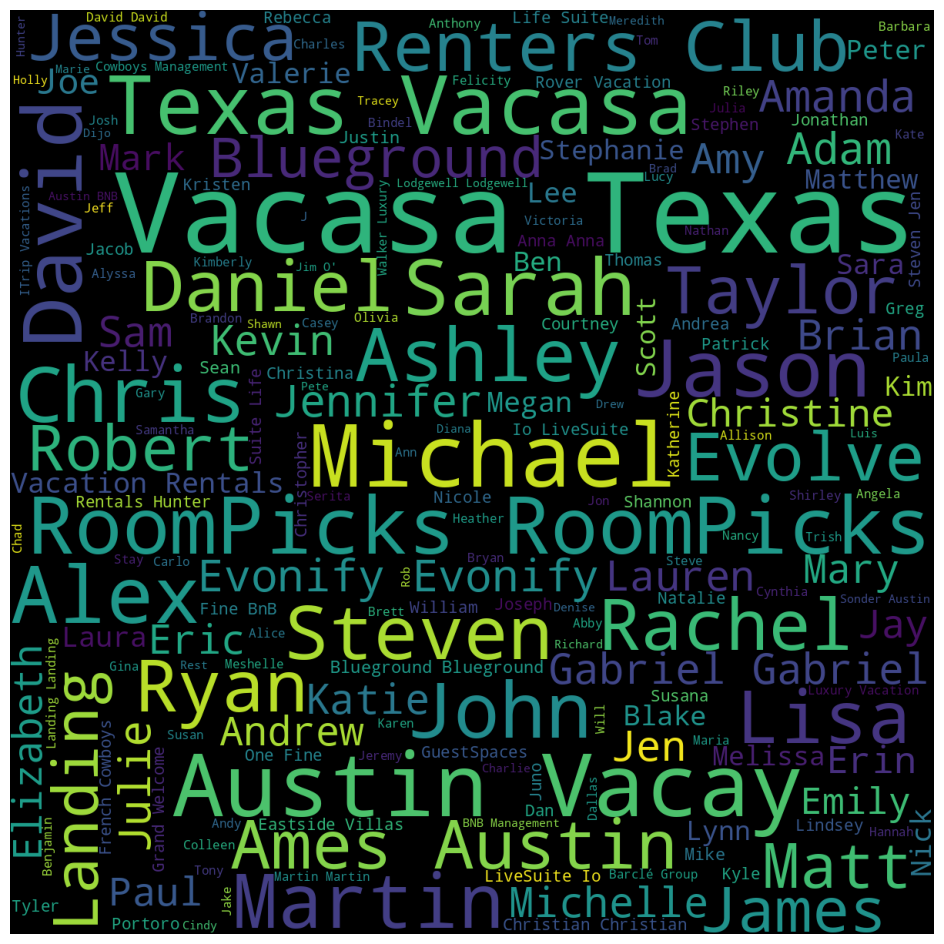

In [8]:
from matplotlib.pyplot import subplots
from matplotlib.pyplot import axis
from matplotlib.pyplot import imshow
from wordcloud import WordCloud
subplots(figsize=(12, 12))
imshow(X=WordCloud(random_state=2023, height=1200, width=1200 ).generate(text=' '.join(df['host_name'].fillna('').values.tolist())), )
axis('off')

(-0.5, 1199.5, 1199.5, -0.5)

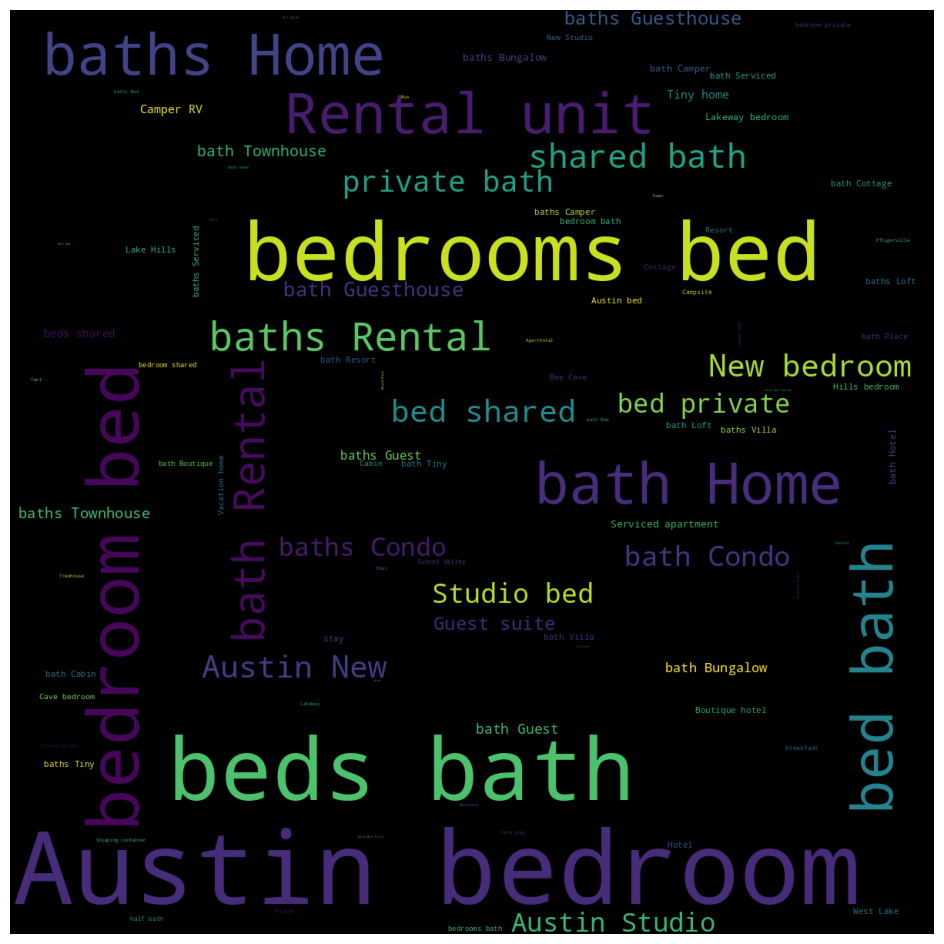

In [9]:
from matplotlib.pyplot import subplots
from matplotlib.pyplot import axis
from matplotlib.pyplot import imshow
from wordcloud import WordCloud
subplots(figsize=(12, 12))
imshow(X=WordCloud(random_state=2023, height=1200, width=1200 ).generate(text=' '.join(df['name'].fillna('').values.tolist())), )
axis('off')